In [1]:
import model
import data
import util

from pathlib import Path
import csv
import pandas as pd
import numpy as np

import torch
import numpy as np
from scipy.special import entr
from scipy.linalg import svd

model_family_dir = Path('model/reddit')
fields = data.load_fields(model_family_dir)
comms = fields['community'].vocab.itos
comms = [comm for comm in comms]


def normalize(w):
    return w/np.sqrt( (w**2).sum(axis=1) )[:,None] 

model/reddit/text.field
Using existing fields.


## Load the social network-based embedding

In [2]:
# load the social network-based embedding
with open('embedding/web-redditEmbeddings-subreddits.csv', 'r') as f:
    web_vecs = {}
    reader = csv.reader(f) 
    for row in reader:
        web_vecs[row[0]] = [float(a) for a in row[1:]]
web_embed = np.array([web_vecs[comm.lower()] for comm in comms]) # order the rows correctly
web_embed = normalize(web_embed)

## Load the CCLM embeddings

In [3]:
model_dir = model_family_dir
model_names = [f"{arch}-3-{i}" for arch in ('lstm', 'transformer') for i in range(4)]
cclm_embed = {m: normalize(util.extract_comm_embedding(model_dir/m)) for m in model_names}

## Compute the embedding alignments

In [16]:
def embedding_alignment(e1, e2):
    prod = np.matmul(e1.T, e2)
    u, s, vh = svd(prod)
    return u, s, vh

def print_alignment(e1, e2):
    _, s, _ = embedding_alignment(e1, e2)
    print(f"Component alignment factors (sorted):")
    for k, factor in enumerate(s):
        print(f"{k:2d}: {factor:0.4f}")
    print(f"Sum: {s.sum()}\n")

### Check alignment of random embeddings

(Against each other and against the web and CCLM embeddings)

In [17]:
from itertools import combinations

# wget "https://www.random.org/sequences/?min=0&max=9999&col=1&format=plain&rnd=new" -O embeddings/random/sample1.txt

cclm_shape = next(iter(cclm_embed.values())).shape
cclm_size = cclm_shape[0] * cclm_shape[1]

random_embed = {}
for i in range(3):
    numbers = list(map(int, open(f"embedding/random/sample{i+1}.txt").read().strip().split('\n')))
    numbers_array = np.array(numbers)[:cclm_size].reshape(cclm_shape)
    random_embed[i] = normalize(numbers_array - 5000)
    
for i,j in combinations(range(3), 2):
    print(f"Random embedding {i} and {j}")
    print_embedding_alignment(random_embed[i], random_embed[j])

for i in range(3):
    print(f"Random embedding {i} and Web embedding")
    print_embedding_alignment(random_embed[i], web_embed)

for m in model_names:
    i = 0
    print(f"Random embedding {i} and {m} embedding")
    print_embedding_alignment(random_embed[i], cclm_embed[m])

Random embedding 0 and 1
Component alignment factors (sorted):
 0: 10.1098
 1: 8.9901
 2: 7.7989
 3: 6.9641
 4: 5.9673
 5: 5.5089
 6: 5.0497
 7: 4.8521
 8: 4.1749
 9: 3.9051
10: 3.4152
11: 2.4313
12: 1.7085
13: 1.4029
14: 0.8578
15: 0.2050
Sum: 73.34160188487488

Random embedding 0 and 2
Component alignment factors (sorted):
 0: 10.0008
 1: 9.6218
 2: 8.1342
 3: 7.5942
 4: 6.7456
 5: 6.3179
 6: 5.3202
 7: 4.7134
 8: 4.1599
 9: 3.2912
10: 2.9887
11: 2.6337
12: 2.1663
13: 1.0621
14: 1.0340
15: 0.1313
Sum: 75.9151545088361

Random embedding 1 and 2
Component alignment factors (sorted):
 0: 9.7176
 1: 8.8986
 2: 8.3052
 3: 7.9925
 4: 6.9915
 5: 5.9826
 6: 4.9010
 7: 4.2576
 8: 3.9309
 9: 3.7087
10: 2.2931
11: 2.0100
12: 1.4878
13: 1.2361
14: 0.4532
15: 0.0599
Sum: 72.22636723070237

Random embedding 0 and Web embedding
Component alignment factors (sorted):
 0: 14.4467
 1: 9.6438
 2: 7.5876
 3: 6.2127
 4: 5.3498
 5: 4.8809
 6: 4.4888
 7: 4.2552
 8: 3.8268
 9: 3.5822
10: 3.5004
11: 2.9928
12

### Compute alignment of the CCLM embeddings to the web embedding

In [6]:
for m in model_names:
    print(f"Web embedding and {m} embedding")
    print_embedding_alignment(web_embed, cclm_embed[m])

Web embedding and lstm-3-0 embedding
Component alignment factors (sorted):
 0: 53.6903
 1: 32.4509
 2: 28.0373
 3: 24.0740
 4: 21.5431
 5: 18.6678
 6: 15.9007
 7: 10.2621
 8: 9.4307
 9: 7.6781
10: 7.1604
11: 6.9054
12: 6.4541
13: 5.4190
14: 4.7805
15: 3.4821
Sum: 255.9365554091179

Web embedding and lstm-3-1 embedding
Component alignment factors (sorted):
 0: 53.3994
 1: 35.5509
 2: 30.4297
 3: 24.7157
 4: 23.2531
 5: 17.7051
 6: 13.3046
 7: 11.3301
 8: 10.1983
 9: 9.3638
10: 8.2405
11: 6.6922
12: 5.8094
13: 5.4660
14: 5.0060
15: 4.3978
Sum: 264.86249685144867

Web embedding and lstm-3-2 embedding
Component alignment factors (sorted):
 0: 53.2322
 1: 35.3993
 2: 31.1710
 3: 25.0966
 4: 22.1278
 5: 18.1011
 6: 12.7432
 7: 11.8691
 8: 9.3804
 9: 8.2143
10: 7.5201
11: 6.7847
12: 5.6535
13: 4.7953
14: 4.5013
15: 4.2425
Sum: 260.83242013673555

Web embedding and lstm-3-3 embedding
Component alignment factors (sorted):
 0: 55.2846
 1: 36.2890
 2: 29.8204
 3: 26.0393
 4: 23.1025
 5: 18.0595
 

In [192]:
from itertools import product 

for m1, m2 in product(model_names, model_names):
    print(f"{m1} and {m2} embeddings")
    print_embedding_alignment(cclm_embed[m1], cclm_embed[m2])
#     _, s, _ = embedding_alignment(cclm_embed[m1], cclm_embed[m2])
#     print(f"{m1} and {m2} embeddings: {s.sum()}")

lstm-3-0 and lstm-3-0 embeddings
Component alignment factors (sorted):
 0: 64.1669
 1: 43.0114
 2: 40.4542
 3: 38.6997
 4: 36.9314
 5: 33.6061
 6: 29.9532
 7: 29.4869
 8: 27.4691
 9: 26.5014
10: 26.1751
11: 25.1462
12: 24.0729
13: 23.6642
14: 21.5418
15: 19.1195
Sum: 510.0

lstm-3-0 and lstm-3-1 embeddings
Component alignment factors (sorted):
 0: 59.2257
 1: 43.6362
 2: 38.0958
 3: 33.6025
 4: 31.4828
 5: 27.4953
 6: 24.5286
 7: 22.3202
 8: 19.5187
 9: 17.8701
10: 16.3081
11: 15.3372
12: 14.8014
13: 12.9320
14: 6.0411
15: 2.9927
Sum: 386.1884460449219

lstm-3-0 and lstm-3-2 embeddings
Component alignment factors (sorted):
 0: 57.7816
 1: 41.1669
 2: 37.5612
 3: 35.0803
 4: 31.8122
 5: 27.1569
 6: 23.1261
 7: 20.6041
 8: 18.8424
 9: 16.2663
10: 14.9937
11: 12.7683
12: 12.1829
13: 9.0581
14: 6.4471
15: 0.1059
Sum: 364.9539794921875

lstm-3-0 and lstm-3-3 embeddings
Component alignment factors (sorted):
 0: 58.0715
 1: 42.7599
 2: 36.3756
 3: 35.3084
 4: 29.5300
 5: 28.2858
 6: 23.2724
 

In [197]:
cclm_combined = np.concatenate([cclm_embed['transformer-3-0'], cclm_embed['lstm-3-1']], axis=1)

In [208]:
s = print_embedding_alignment(web_embed, np.concatenate([cclm_embed['transformer-3-0'], random_embed[0]], axis=1))


Component alignment factors (sorted):
 0: 57.7774
 1: 42.0823
 2: 32.1087
 3: 27.1449
 4: 22.3435
 5: 17.4771
 6: 13.2860
 7: 11.9684
 8: 11.0755
 9: 8.7086
10: 8.4559
11: 8.0622
12: 7.8333
13: 6.4264
14: 5.9218
15: 5.2100
16: 4.6315
17: 4.1510
18: 3.9170
19: 3.6288
20: 3.1547
21: 2.8403
22: 2.6632
23: 2.5931
24: 2.5429
25: 2.5131
26: 2.1429
27: 2.0328
28: 1.8754
29: 1.7595
30: 1.5990
31: 1.4463
Sum: 329.37345729647166



In [205]:
s = print_embedding_alignment(web_embed, np.concatenate([cclm_embed['lstm-3-1'], random_embed[0]], axis=1))

Component alignment factors (sorted):
 0: 54.1452
 1: 36.2675
 2: 31.0541
 3: 25.8850
 4: 23.7121
 5: 18.3028
 6: 15.3142
 7: 12.6252
 8: 10.7453
 9: 9.9431
10: 8.5470
11: 7.7272
12: 6.8059
13: 5.8551
14: 5.8028
15: 4.9411
16: 4.7124
17: 3.9372
18: 3.7115
19: 3.4878
20: 3.0284
21: 2.8932
22: 2.7716
23: 2.6427
24: 2.5599
25: 2.2642
26: 2.1101
27: 1.9554
28: 1.7970
29: 1.7565
30: 1.7187
31: 1.5573
Sum: 320.5775309035226



In [211]:
s = print_embedding_alignment(web_embed, np.concatenate([random_embed[1], random_embed[0]], axis=1))

Component alignment factors (sorted):
 0: 18.8265
 1: 11.7721
 2: 10.7233
 3: 8.4000
 4: 7.6520
 5: 7.2011
 6: 6.0660
 7: 5.5698
 8: 5.2827
 9: 4.9819
10: 4.6621
11: 4.4026
12: 4.2320
13: 4.0806
14: 3.7002
15: 3.6571
16: 3.4645
17: 3.2120
18: 3.1103
19: 2.9686
20: 2.8478
21: 2.7597
22: 2.4925
23: 2.2839
24: 2.2001
25: 2.1262
26: 2.0573
27: 1.9981
28: 1.7486
29: 1.6672
30: 1.5684
31: 1.4576
Sum: 149.1727880045588



In [209]:
s = print_embedding_alignment(web_embed, cclm_combined)


Component alignment factors (sorted):
 0: 77.8748
 1: 54.6046
 2: 43.8178
 3: 36.0234
 4: 31.8501
 5: 24.4143
 6: 17.7556
 7: 15.1889
 8: 14.1671
 9: 12.1630
10: 11.5549
11: 9.2302
12: 8.5768
13: 8.0315
14: 7.2189
15: 6.2137
16: 4.4536
17: 4.1771
18: 3.6448
19: 2.7451
20: 2.2501
21: 2.0182
22: 1.6277
23: 1.4019
24: 1.3474
25: 1.2117
26: 1.0570
27: 0.9377
28: 0.8688
29: 0.7464
30: 0.5816
31: 0.5325
Sum: 408.2872817141437



In [210]:
web_embed.shape

(510, 300)

In [184]:
model = 'transformer-3-1'

u, s, vh = embedding_alignment(web_embed, cclm_embed[model])

In [185]:
df = pd.DataFrame({
    'web_0':      np.dot(web_embed, u[:,0]),
    'web_1':      np.dot(web_embed, u[:,1]),
    f'{model}_0': np.dot(cclm_embed[model], vh[0]),
    f'{model}_1': np.dot(cclm_embed[model], vh[1])
})
df['community'] = comms

In [186]:
from sklearn.cluster import KMeans

In [187]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(web_embed)
df['cluster'] = [str(l) for l in kmeans.labels_]

In [188]:
import plotly.express as px
px.scatter(df.reset_index(), x='web_0', y='web_1', hover_name='community', color='cluster')

In [189]:
px.scatter(df.reset_index(), x=f'{model}_0', y=f'{model}_1', hover_name='community', color='cluster')

In [148]:
singular_values = []
for arch in ('lstm', 'transformer'):
    for lc in range(4):
        model = f'{arch}-3-{lc}'
        u, s, vh = embedding_alignment(web_embed, cclm_embed[model])
        for i, s_i in enumerate(s):
            singular_values.append({'arch': arch, 'lc': lc, 'i': i, 's_i': s_i})
df = pd.DataFrame(singular_values)

In [153]:
import plotly.graph_objects as go

value_no = list(range(16))

fig = go.Figure()

for arch in ('lstm', 'transformer'):
    for lc in range(4):
        color = 'blue' if arch == 'lstm' else 'red'
        model = f'{arch}-3-{lc}'
        u, s, vh = embedding_alignment(web_embed, cclm_embed[model])
        fig.add_trace(go.Bar(x=value_no,
                        y=list(s),
                        name=model,
                        marker_color=color
                        ))
fig.show()

In [33]:
from test_lmcc import exp_normalize, confusion_matrix

In [271]:
df = pd.read_csv(model_dir/'nll.csv').rename(columns=lambda x: x.lower())
df = df.rename(columns={'community': 'actual_comm'})
df['actual_comm'] = df['actual_comm'].apply(lambda x: fields['community'].vocab.itos[x].lower())



In [289]:
nll = df[comms].to_numpy() # -log(P(m|c))

comm_probs = exp_normalize((-nll).T, 0).T # P(c|m) (?)
df[comms] = comm_probs # now the dataframe contains P(c|m)
C = confusion_matrix(df[['actual_comm'] + comms]) 

In [294]:
from scipy.special import softmax

In [ ]:
softmax

In [269]:
import plotly.graph_objects as go

def plot_confusion(C, sort_diagonal=True):
    if sort_diagonal:
        diagonal = C.apply(lambda x: x[x.name])
        comms_sorted = diagonal.sort_values(ascending=False).index
        C = C.loc[comms_sorted][comms_sorted]
    fig = go.Figure(
        data=go.Heatmap(
            z=C.values,
            y = C.columns,
            x = C.index,
                       ))
    fig.update_layout(height=800, width=800, font=dict(size=8), title='')
    return fig.show()

In [293]:
plot_confusion(C)

In [132]:
indisc = C.apply(lambda x: ppl(x) / len(comms))
indisc.index.name = 'comm'
# df = df.rename(columns={'pred_comm': 'indics'})

In [133]:
df = pd.DataFrame(indisc, columns=['indisc'])
df['v1_proj'] = pd.Series(dict(zip(comms, v1_proj)))
df['u1_proj'] = pd.Series(dict(zip(comms, u1_proj)))

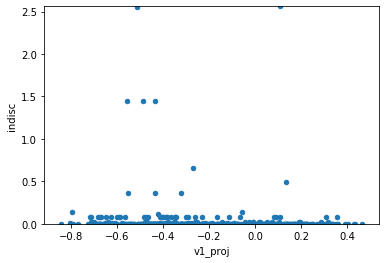

In [136]:
%matplotlib inline
from scipy.stats import spearmanr, pearsonr

df.plot.scatter('v1_proj', 'indisc', ylim=(0, 2.560))

In [140]:
spearmanr(df['v1_proj'], df['u1_proj'])

SpearmanrResult(correlation=0.8118227833157646, pvalue=8.715938074060606e-121)